In [14]:
!pip install helper_functions


  Using cached helper_functions-2.0.11.tar.gz (6.8 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'error'


  error: subprocess-exited-with-error
  
  python setup.py egg_info did not run successfully.
  exit code: 1
  
  [15 lines of output]
  The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
  rather than 'sklearn' for pip commands.
  
  Here is how to fix this error in the main use cases:
  - use 'pip install scikit-learn' rather than 'pip install sklearn'
  - replace 'sklearn' by 'scikit-learn' in your pip requirements files
    (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
  - if the 'sklearn' package is used by one of your dependencies,
    it would be great if you take some time to track which package uses
    'sklearn' instead of 'scikit-learn' and report it to their issue tracker
  - as a last resort, set the environment variable
    SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
  
  More information is available at
  https://github.com/scikit-learn/sklearn-pypi-package
  [end of output]
  
  note: This error originates from a subpr

In [7]:
import matplotlib.pyplot as plt
import torch
import torchvision
import os
from torch import nn
from torchvision import transforms
from helper_functions import set_seeds

ModuleNotFoundError: No module named 'helper_functions'

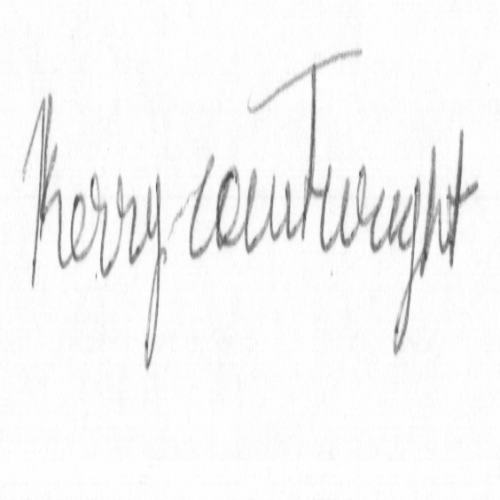

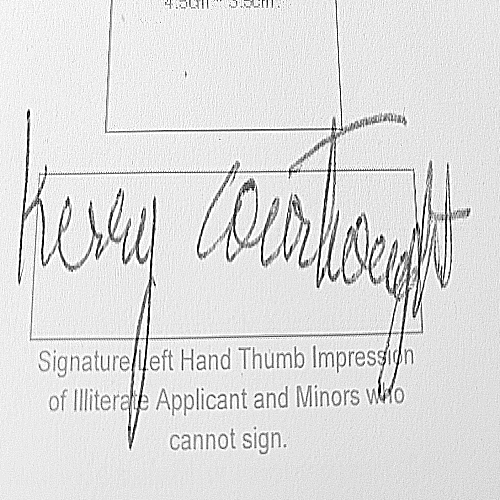

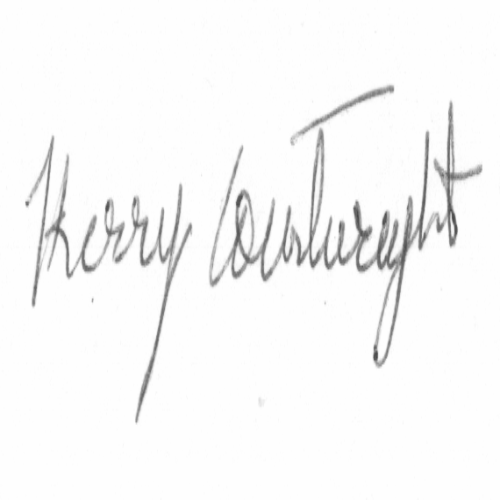

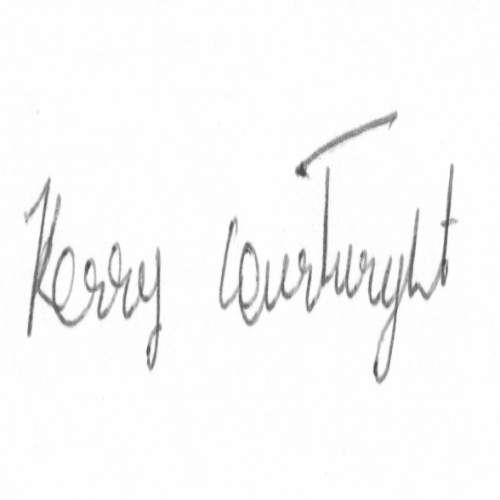

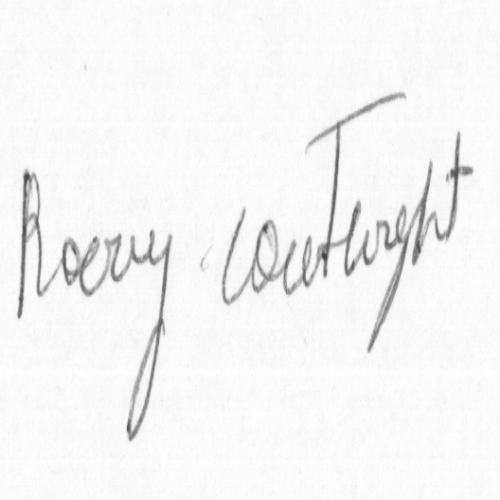

...

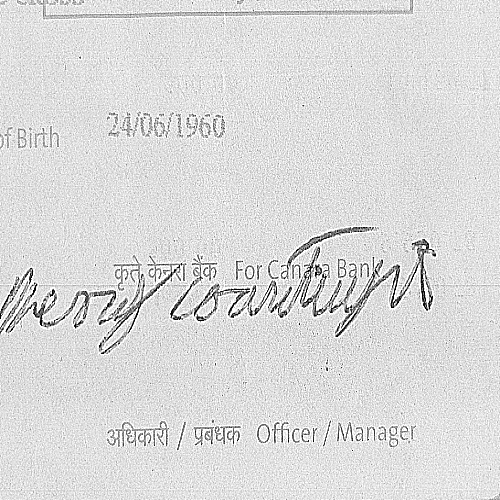

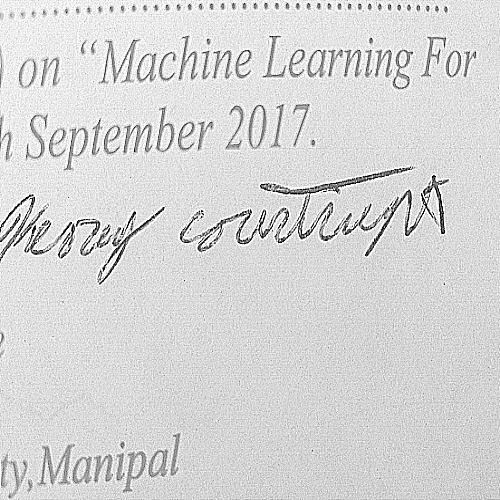

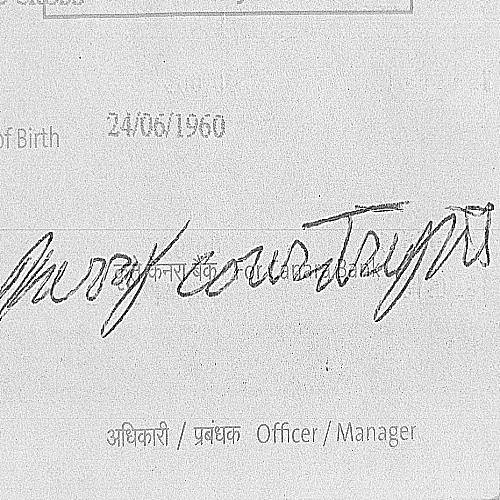

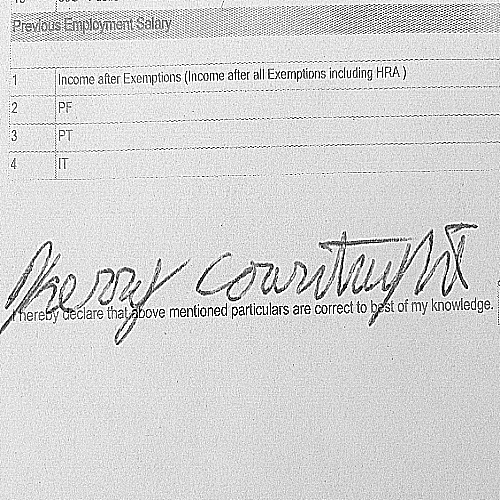

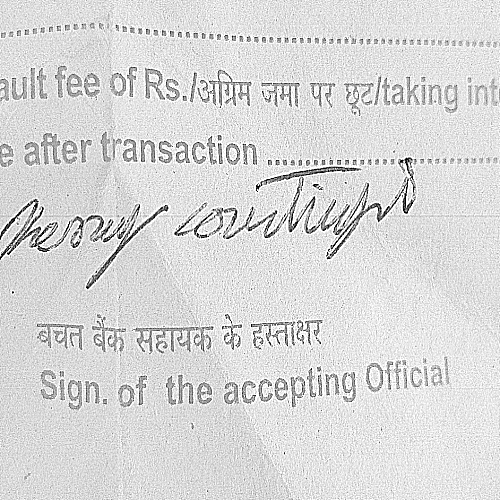

In [8]:
from PIL import Image

def load_images_from_folder(folder_path):
  images = []
  for filename in os.listdir(folder_path):
    image = Image.open(os.path.join(folder_path, filename))
    images.append(image)
  return images

images = load_images_from_folder("C:/Users/shubh/Downloads/archive (2)/055")

for image in images:
  display(image)

In [9]:
import argparse
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision
from torchvision.transforms import Compose, ToTensor, Resize
from torch import optim
import numpy as np
from torch.hub import tqdm


class PatchExtractor(nn.Module):
    def __init__(self, patch_size=16):
        super().__init__()
        self.patch_size = patch_size

    def forward(self, input_data):
        batch_size, channels, height, width = input_data.size()
        assert height % self.patch_size == 0 and width % self.patch_size == 0, \
            f"Input height ({height}) and width ({width}) must be divisible by patch size ({self.patch_size})"

        num_patches_h = height // self.patch_size
        num_patches_w = width // self.patch_size
        num_patches = num_patches_h * num_patches_w

        patches = input_data.unfold(2, self.patch_size, self.patch_size). \
            unfold(3, self.patch_size, self.patch_size). \
            permute(0, 2, 3, 1, 4, 5). \
            contiguous(). \
            view(batch_size, num_patches, -1)

        # Expected shape of a patch on default settings is (4, 196, 768)

        return patches


class InputEmbedding(nn.Module):

    def __init__(self, args):
        super(InputEmbedding, self).__init__()
        self.patch_size = args.patch_size
        self.n_channels = args.n_channels
        self.latent_size = args.latent_size
        use_cuda = not args.no_cuda and torch.cuda.is_available()
        self.device = torch.device("cuda" if use_cuda else "cpu")
        self.batch_size = args.batch_size
        self.input_size = self.patch_size * self.patch_size * self.n_channels

        # Linear projection
        self.LinearProjection = nn.Linear(self.input_size, self.latent_size)
        # Class token
        self.class_token = nn.Parameter(torch.randn(self.batch_size, 1, self.latent_size).to(self.device))
        # Positional embedding
        self.pos_embedding = nn.Parameter(torch.randn(self.batch_size, 1, self.latent_size).to(self.device))

    def forward(self, input_data):
        input_data = input_data.to(self.device)
        # Patchifying the Image
        patchify = PatchExtractor(patch_size=self.patch_size)
        patches = patchify(input_data)

        linear_projection = self.LinearProjection(patches).to(self.device)
        b, n, _ = linear_projection.shape
        linear_projection = torch.cat((self.class_token, linear_projection), dim=1)
        pos_embed = self.pos_embedding[:, :n + 1, :]
        linear_projection += pos_embed

        return linear_projection


class EncoderBlock(nn.Module):

    def __init__(self, args):
        super(EncoderBlock, self).__init__()

        self.latent_size = args.latent_size
        self.num_heads = args.num_heads
        self.dropout = args.dropout
        self.norm = nn.LayerNorm(self.latent_size)
        self.attention = nn.MultiheadAttention(self.latent_size, self.num_heads, dropout=self.dropout)
        self.enc_MLP = nn.Sequential(
            nn.Linear(self.latent_size, self.latent_size * 4),
            nn.GELU(),
            nn.Dropout(self.dropout),
            nn.Linear(self.latent_size * 4, self.latent_size),
            nn.Dropout(self.dropout)
        )

    def forward(self, emb_patches):
        first_norm = self.norm(emb_patches)
        attention_out = self.attention(first_norm, first_norm, first_norm)[0]
        first_added = attention_out + emb_patches
        second_norm = self.norm(first_added)
        mlp_out = self.enc_MLP(second_norm)
        output = mlp_out + first_added

        return output


class ViT(nn.Module):
    def __init__(self, args):
        super(ViT, self).__init__()

        self.num_encoders = args.num_encoders
        self.latent_size = args.latent_size
        self.num_classes = args.num_classes
        self.dropout = args.dropout

        self.embedding = InputEmbedding(args)
        # Encoder Stack
        self.encoders = nn.ModuleList([EncoderBlock(args) for _ in range(self.num_encoders)])
        self.MLPHead = nn.Sequential(
            nn.LayerNorm(self.latent_size),
            nn.Linear(self.latent_size, self.latent_size),
            nn.Linear(self.latent_size, self.num_classes),
        )

    def forward(self, test_input):
        enc_output = self.embedding(test_input)
        for enc_layer in self.encoders:
            enc_output = enc_layer(enc_output)

        class_token_embed = enc_output[:, 0]
        return self.MLPHead(class_token_embed)


class TrainEval:

    def __init__(self, args, model, train_dataloader, val_dataloader, optimizer, criterion, device):
        self.model = model
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.optimizer = optimizer
        self.criterion = criterion
        self.epoch = args.epochs
        self.device = device
        self.args = args

    def train_fn(self, current_epoch):
        self.model.train()
        total_loss = 0.0
        tk = tqdm(self.train_dataloader, desc="EPOCH" + "[TRAIN]" + str(current_epoch + 1) + "/" + str(self.epoch))

        for t, data in enumerate(tk):
            images, labels = data
            images, labels = images.to(self.device), labels.to(self.device)
            self.optimizer.zero_grad()
            logits = self.model(images)
            loss = self.criterion(logits, labels)
            loss.backward()
            self.optimizer.step()

            total_loss += loss.item()
            tk.set_postfix({"Loss": "%6f" % float(total_loss / (t + 1))})
            if self.args.dry_run:
                break

        return total_loss / len(self.train_dataloader)

    def eval_fn(self, current_epoch):
        self.model.eval()
        total_loss = 0.0
        tk = tqdm(self.val_dataloader, desc="EPOCH" + "[VALID]" + str(current_epoch + 1) + "/" + str(self.epoch))

        for t, data in enumerate(tk):
            images, labels = data
            images, labels = images.to(self.device), labels.to(self.device)

            logits = self.model(images)
            loss = self.criterion(logits, labels)

            total_loss += loss.item()
            tk.set_postfix({"Loss": "%6f" % float(total_loss / (t + 1))})
            if self.args.dry_run:
                break

        return total_loss / len(self.val_dataloader)

    def train(self):
        best_valid_loss = np.inf
        best_train_loss = np.inf
        for i in range(self.epoch):
            train_loss = self.train_fn(i)
            val_loss = self.eval_fn(i)

            if val_loss < best_valid_loss:
                torch.save(self.model.state_dict(), "best-weights.pt")
                print("Saved Best Weights")
                best_valid_loss = val_loss
                best_train_loss = train_loss
        print(f"Training Loss : {best_train_loss}")
        print(f"Valid Loss : {best_valid_loss}")

    '''
        On default settings:
        
        Training Loss : 2.3081023390197752
        Valid Loss : 2.302861615943909
        
        However, this score is not competitive compared to the 
        high results in the original paper, which were achieved 
        through pre-training on JFT-300M dataset, then fine-tuning 
        it on the target dataset. To improve the model quality 
        without pre-training, we could try training for more epochs, 
        using more Transformer layers, resizing images or changing 
        patch size,
    '''


def main():
    parser = argparse.ArgumentParser(description='Vision Transformer in PyTorch')
    parser.add_argument('--no-cuda', action='store_true', default=False,
                        help='disables CUDA training')
    parser.add_argument('--patch-size', type=int, default=16,
                        help='patch size for images (default : 16)')
    parser.add_argument('--latent-size', type=int, default=768,
                        help='latent size (default : 768)')
    parser.add_argument('--n-channels', type=int, default=3,
                        help='number of channels in images (default : 3 for RGB)')
    parser.add_argument('--num-heads', type=int, default=12,
                        help='(default : 12)')
    parser.add_argument('--num-encoders', type=int, default=12,
                        help='number of encoders (default : 12)')
    parser.add_argument('--dropout', type=int, default=0.1,
                        help='dropout value (default : 0.1)')
    parser.add_argument('--img-size', type=int, default=224,
                        help='image size to be reshaped to (default : 224')
    parser.add_argument('--num-classes', type=int, default=10,
                        help='number of classes in dataset (default : 10 for CIFAR10)')
    parser.add_argument('--epochs', type=int, default=10,
                        help='number of epochs (default : 10)')
    parser.add_argument('--lr', type=float, default=1e-2,
                        help='base learning rate (default : 0.01)')
    parser.add_argument('--weight-decay', type=int, default=3e-2,
                        help='weight decay value (default : 0.03)')
    parser.add_argument('--batch-size', type=int, default=4,
                        help='batch size (default : 4)')
    parser.add_argument('--dry-run', action='store_true', default=False,
                        help='quickly check a single pass')
    args = parser.parse_args()

    use_cuda = not args.no_cuda and torch.cuda.is_available()
    device = torch.device("cuda" if use_cuda else "cpu")

    transforms = Compose([
        Resize((args.img_size, args.img_size)),
        ToTensor()
    ])
    train_data = torchvision.datasets.CIFAR10(root='./dataset', train=True, download=True, transform=transforms)
    valid_data = torchvision.datasets.CIFAR10(root='./dataset', train=False, download=True, transform=transforms)
    train_loader = DataLoader(train_data, batch_size=args.batch_size, shuffle=True)
    valid_loader = DataLoader(valid_data, batch_size=args.batch_size, shuffle=True)

    model = ViT(args).to(device)

    optimizer = optim.Adam(model.parameters(), lr=args.lr, weight_decay=args.weight_decay)
    criterion = nn.CrossEntropyLoss()

    TrainEval(args, model, train_loader, valid_loader, optimizer, criterion, device).train()


if __name__ == "__main__":
    main()

usage: ipykernel_launcher.py [-h] [--no-cuda] [--patch-size PATCH_SIZE] [--latent-size LATENT_SIZE]
                             [--n-channels N_CHANNELS] [--num-heads NUM_HEADS] [--num-encoders NUM_ENCODERS]
                             [--dropout DROPOUT] [--img-size IMG_SIZE] [--num-classes NUM_CLASSES] [--epochs EPOCHS]
                             [--lr LR] [--weight-decay WEIGHT_DECAY] [--batch-size BATCH_SIZE] [--dry-run]
ipykernel_launcher.py: error: unrecognized arguments: -f C:\Users\shubh\AppData\Roaming\jupyter\runtime\kernel-70ce1a26-7b60-4809-9a94-c604e45824d5.json


SystemExit: 2

C:\Users\shubh\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [1]:
################AnotherOne#############

In [12]:
import matplotlib.pyplot as plt
import torch
from torch import nn
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os

class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.class_names = os.listdir(data_dir)

    def __len__(self):
        return sum(len(files) for _, _, files in os.walk(self.data_dir))

    def __getitem__(self, idx):
        classes = os.listdir(self.data_dir)
        class_idx = torch.randint(0, len(classes), (1,)).item()
        class_name = classes[class_idx]
        class_dir = os.path.join(self.data_dir, class_name)
        images = os.listdir(class_dir)
        image_name = images[idx % len(images)]
        image_path = os.path.join(class_dir, image_name)
        image = Image.open(image_path).convert('RGB')
        label = class_idx
        if self.transform:
            image = self.transform(image)
        return image, label

# Setup directory path to train images
train_dir = "C:/Users/shubh/Downloads/archive (2)/055"

# Create transform pipeline
IMG_SIZE = 224
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

# Create data loader
BATCH_SIZE = 32
train_dataset = CustomDataset(train_dir, transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

# Sample batch from data loader
image_batch, label_batch = next(iter(train_dataloader))

# Display sample image
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].permute(1, 2, 0))
    plt.title(f"Label: {label_batch[i]}")
    plt.axis("off")
plt.show()


NotADirectoryError: [WinError 267] The directory name is invalid: 'C:/Users/shubh/Downloads/archive (2)/055\\E-S-55-G-03.png'

In [14]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

class SignatureDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = os.listdir(root_dir)

    def __len__(self):
        return sum(len(files) for _, _, files in os.walk(self.root_dir))

    def __getitem__(self, idx):
        class_name = self.classes[idx // 5]  # Each class has five subfolders
        class_dir = os.path.join(self.root_dir, class_name)
        img_files = os.listdir(class_dir)
        img_name = img_files[idx % 5]  # Each subfolder contains some images
        img_path = os.path.join(class_dir, img_name)
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, self.classes.index(class_name)

# Define transformation pipeline
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Define root directory of the dataset
root_dir = "C:/Users/shubh/Downloads/archive (2)/055"

# Create dataset instance
dataset = SignatureDataset(root_dir, transform=transform)

# Create data loader
batch_size = 32
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define ViT model architecture
class ViT(nn.Module):
    def __init__(self):
        super(ViT, self).__init__()
        # Define your ViT model architecture here
        
    def forward(self, x):
        # Implement forward pass
        return x  # Dummy output for now

# Instantiate ViT model
model = ViT().to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    for images, labels in data_loader:
        images, labels = images.to(device), labels.to(device)
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# Save trained model
torch.save(model.state_dict(), 'vit_model.pth')


ValueError: optimizer got an empty parameter list